In [ ]:
# !sudo apt install tesseract-ocr
# !sudo apt-get install tesseract-ocr-kor

# %pip install gdown==4.6.3
# %pip install easyocr
# %pip install pytesseract

In [2]:
import matplotlib.pyplot as plt # 시각화를 위한 라이브러리
from PIL import Image #이미지를 읽기 위한 라이브러리
import cv2 #이미지를 처리를 위한 라이브러리

import numpy as np
import os

import pandas as pd
from IPython.display import display, HTML
import base64

import easyocr
import pytesseract
from pytesseract import Output

## 1. Tesseract 사용해보기

```
💡 목차 개요: OCR 오픈 소스 중 하나인 Tesseract를 활용하여 다양한 이미지에 대한 추론 결과를 얻은 후, 이를 분석해 본다.
```

  * 1-1. 테스트 이미지 로드
  * 1-2. Tesseract를 활용하여 테스트 이미지들에 대한 추론 결과 얻기
  * 1-3. 추론 결과 Visualize 해보기

### 1-1 테스트 이미지 로드

> OCR 추론 결과를 확인해 보기 위한 테스트 이미지들을 불러오는 과정입니다.

In [ ]:
# 테스트 이미지들을 /content/ocr_examples 경로에 mount 하는 과정
!gdown https://drive.google.com/drive/folders/17yoQWDXDwPWqARdDOQep0C6oGyFABMeJ?usp=sharing -O /content/ --folder

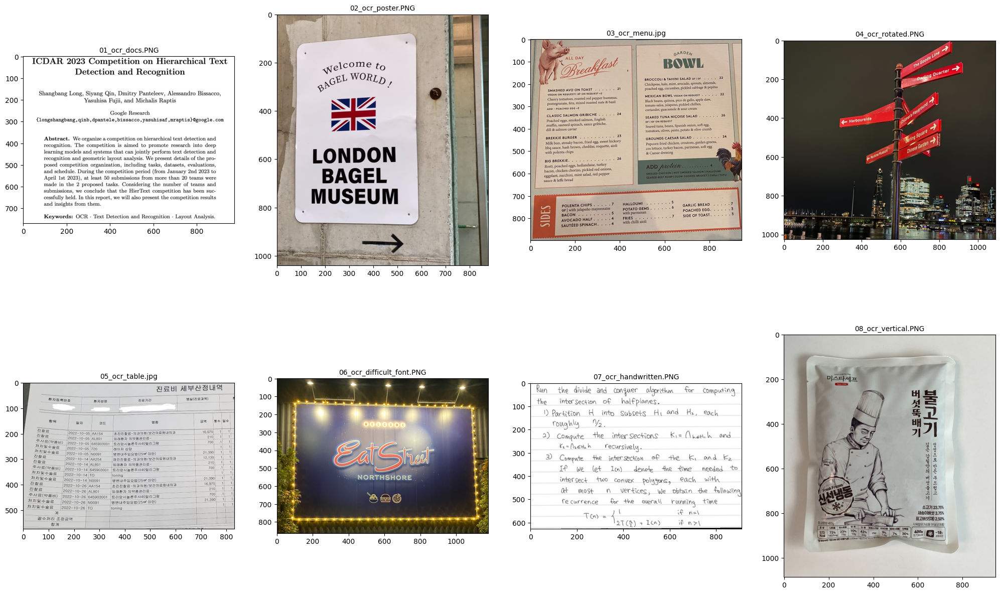

In [ ]:
# Visualization of Test Images
image_list = sorted([fn for fn in os.listdir('/content/ocr_examples/') if fn.endswith('.jpg') or fn.endswith('.PNG')])
images = {}
fig = plt.figure(figsize=(25, 15))

for i, fn in enumerate(image_list):
    images[fn] = cv2.cvtColor(cv2.imread('/content/ocr_examples/'+fn), cv2.COLOR_BGR2RGB)
    a = fig.add_subplot(2, 4, i+1)
    plt.imshow(images[fn])
    a.set_title(fn, fontsize=10)

In [ ]:
# Tesseract가 지원하는 언어 리스트를 출력해 봅니다
# eng와 osd는 default로 설치되지만, 더 많은 언어에 대한 결과를 얻고 싶으면 추가적인 설치가 필요합니다
# 예를 들어, 한국어 모델 설치를 위한 커맨드라인은 아래와 같습니다
# !sudo apt-get install tesseract-ocr-kor

!tesseract --list-langs

List of available languages (3):
eng
kor
osd


In [ ]:
# Tesseract에서 설정할 수 있는 옵션들에 대한 예시

"""
OCR Engine modes(–oem):
0 - Legacy engine only.
1 - Neural nets LSTM engine only.
2 - Legacy + LSTM engines.
3 - Default, based on what is available.

Page segmentation modes(–psm):
0 - Orientation and script detection (OSD) only.
1 - Automatic page segmentation with OSD.
2 - Automatic page segmentation, but no OSD, or OCR.
3 - Fully automatic page segmentation, but no OSD. (Default)
4 - Assume a single column of text of variable sizes.
5 - Assume a single uniform block of vertically aligned text.
6 - Assume a single uniform block of text.
7 - Treat the image as a single text line.
8 - Treat the image as a single word.
9 - Treat the image as a single word in a circle.
10 - Treat the image as a single character.
11 - Sparse text. Find as much text as possible in no particular order.
12 - Sparse text with OSD.
13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.
"""

# 각 이미지에 대한 추론 결과들을 results_tesseract에 저장
results_tesseract = {}
for fn in images:
    psm = '5' if 'vertical' in fn else '3'
    # tesseract의 추론 결과를 dictionary 형태로 저장하는 과정
    # dictionary로 저장하게 되면 검출기를 통해 얻은 text 영역의 bounding box 정보와 text를 인식한 결과를 얻을 수 있음
    # language는 영어와 한국어를 동시에 인식할 수 있도록 설정
    print(f'==> Saving Results for {fn} ...')
    result = pytesseract.image_to_data(images[fn], output_type=Output.DICT, lang='kor+eng', config=f'--psm {psm}')
    results_tesseract[fn] = result

# 가장 처음 이미지에 대해서만 추론 결과를 string으로 출력
fn = list(images.keys())[0]
result_string = pytesseract.image_to_string(images[fn], lang='kor+eng')
print(f'\n* String Results of {fn}\n{result_string.rstrip()}')

==> Saving Results for 01_ocr_docs.PNG ...
==> Saving Results for 02_ocr_poster.PNG ...
==> Saving Results for 03_ocr_menu.jpg ...
==> Saving Results for 04_ocr_rotated.PNG ...
==> Saving Results for 05_ocr_table.jpg ...
==> Saving Results for 06_ocr_difficult_font.PNG ...
==> Saving Results for 07_ocr_handwritten.PNG ...
==> Saving Results for 08_ocr_vertical.PNG ...

* String Results of 01_ocr_docs.PNG
ICDAR 2023 Competition on Hierarchical Text
Detection and Recognition

Shangbang Long, Siyang Qin, Dmitry Panteleev, Alessandro Bissacco,
Yasuhisa Fujii, and Michalis Raptis

Google Research
{longshangbang, qinb,dpantele,bissacco,yasuhisaf »mraptis}@google .com

Abstract. We organize a competition on hierarchical text detection and
recognition. The competition is aimed to promote research into deep
learning models and systems that can jointly perform text detection and
recognition and geometric layout analysis. We present details of the pro-
posed competition organization, including ta

,file name,img,predictions with high conf,predictions with low conf
0,01_ocr_docs.PNG,,"[bbox 4] : ICDAR 0.90 [bbox 5] : 2023 0.95 [bbox 6] : Competition 0.96 [bbox 7] : on 0.96 [bbox 8] : Hierarchical 0.95 [bbox 9] : Text 0.96 [bbox 11] : Detection 0.96 [bbox 12] : and 0.96 [bbox 13] : Recognition 0.96 [bbox 17] : Shangbang 0.91 [bbox 18] : Long, 0.93 [bbox 19] : Siyang 0.91 [bbox 20] : Qin, 0.96 [bbox 21] : Dmitry 0.93 [bbox 22] : Panteleev, 0.91 [bbox 23] : Alessandro 0.92 [bbox 24] : Bissacco, 0.92 [bbox 26] : Yasuhisa 0.79 [bbox 27] : Fujii, 0.96 [bbox 28] : and 0.93 [bbox 29] : Michalis 0.92 [bbox 30] : Raptis 0.93 [bbox 34] : Google 0.96 [bbox 35] : Research 0.96 [bbox 37] : {longshangbang, 0.91 [bbox 38] : qinb,dpantele,bissacco,yasuhisaf 0.63 [bbox 39] : »mraptis}@google 0.63 [bbox 40] : .com 0.78 [bbox 44] : Abstract. 0.96 [bbox 45] : We 0.96",
1,02_ocr_poster.PNG,,[bbox 6] : ||| 0.52 [bbox 24] : Hi. 0.50 [bbox 30] : elc 0.89 [bbox 31] : ome 0.95 [bbox 32] : to 0.96 [bbox 34] : oo 0.54 [bbox 39] : WIG 0.62 [bbox 43] : LONDON 0.96 [bbox 44] : | 0.69 [bbox 46] : BAGEL 0.95 [bbox 50] : MUSEUM 0.62 [bbox 54] : = 0.55,[bbox 4] : 기 0.15 [bbox 5] : nas 0.24 [bbox 26] : ——_ 0.34 [bbox 35] : ey 0.17 [bbox 41] : She 0.34 [bbox 47] : = 0.20 [bbox 49] : | 0.34 [bbox 66] : = 0.25
2,03_ocr_menu.jpg,,"[bbox 56] : SMASHED 0.93 [bbox 57] : AVO 0.91 [bbox 62] : = 0.77 [bbox 63] : = 0.64 [bbox 65] : VEGAN 0.96 [bbox 66] : ON 0.93 [bbox 68] : GF 0.96 [bbox 69] : ON 0.96 [bbox 70] : REQUEST 0.85 [bbox 71] : +2 0.96 [bbox 74] : Cherry 0.94 [bbox 75] : tomatoes, 0.95 [bbox 76] : roasted 0.91 [bbox 77] : red 0.91 [bbox 78] : pepper 0.96 [bbox 79] : hummus, 0.94 [bbox 81] : pomegranate, 0.96 [bbox 82] : feta, 0.96 [bbox 83] : mixed 0.96 [bbox 84] : roasted 0.96 [bbox 85] : nuts 0.93 [bbox 86] : & 0.93 [bbox 87] : basil 0.96 [bbox 89] : ‘ADD 0.60 [bbox 90] : - 0.81 [bbox 91] : POACHED 0.96 [bbox 92] : EGG 0.88 [bbox 93] : +3 0.83 [bbox 97] : CLASSIC 0.71 [bbox 98] : SALMON 0.92",[bbox 58] : ON 0.18 [bbox 59] : TOAST 0.18 [bbox 60] : ..- 0.28 [bbox 61] : = 0.31 [bbox 67] : REGUEST!| 0.31 [bbox 120] : ee 0.25 [bbox 121] : eee 0.35 [bbox 160] : Essie 0.22 [bbox 161] : eo 0.11 [bbox 162] : ert 0.28 [bbox 163] : een 0.25 [bbox 197] : CHIPS. 0.47 [bbox 198] : --- 0.42 [bbox 199] : = 0.23 [bbox 210] : 0 0.15 [bbox 211] : = 0.15 [bbox 212] : oe 0.14 [bbox 214] : AVOCADOHALF..--- 0.11 [bbox 218] : - 0.39 [bbox 277] : cr 0.45 [bbox 309] : + 0.46 [bbox 310] : = 0.48 [bbox 442] : POACHEDEGG...-- 0.32 [bbox 443] : = 0.36 [bbox 447] : SIDEOFTOAST... 0.11 [bbox 448] : ++ 0.11 [bbox 449] : +3 0.16 [bbox 469] : FRIES... 0.28 [bbox 470] : > 0.41
3,04_ocr_rotated.PNG,,,
4,05_ocr_table.jpg,,[bbox 4] : 진료비 0.93 [bbox 5] : 세 0.93 [bbox 6] : 부 0.93 [bbox 7] : 산 0.92 [bbox 8] : 정 0.93 [bbox 9] : 내역 0.83 [bbox 165] : 환 0.91 [bbox 166] : 자 0.92 [bbox 167] : 등 0.89 [bbox 168] : 록 0.87 [bbox 169] : 번호 0.96 [bbox 170] : 환 0.90 [bbox 171] : 자 0.93 [bbox 172] : 성명 0.95 [bbox 173] : 진 0.93 [bbox 174] : 료 0.92 [bbox 175] : 기간 0.96 [bbox 176] : ㅣ 0.60 [bbox 178] : 실 0.72 [bbox 179] : ( 0.93 [bbox 180] : 진 0.93 [bbox 181] : 료 0.93 [bbox 182] : 과 0.93 [bbox 183] : 목 0.81 [bbox 184] : ) 0.92 [bbox 187] : — 0.60 [bbox 189] : 1 0.84 [bbox 192] : ee 0.51 [bbox 193] : 금액 0.96 [bbox 194] : Al 0.66,"[bbox 177] : 별 0.47 [bbox 185] : : 0.44 [bbox 200] : sa 0.30 [bbox 202] : a 0.31 [bbox 207] : jam 0.29 [bbox 210] : ~ 0.12 [bbox 212] : [AAi54 0.23 [bbox 225] : 뭔 0.38 [bbox 229] : 16.9/ 0.37 [bbox 230] : 의 0.43 [bbox 231] : 4 0.48 [bbox 232] : | 0.32 [bbox 234] : __|2022-10-05 0.49 [bbox 246] : 29 0.48 [bbox 248] : | 0.41 [bbox 257] : 놀 0.22 [bbox 266] : 700 0.34 [bbox 267] : 4] 0.37 [bbox 269] : a 0.48 [bbox 272] : [720 0.49 [bbox 278] : |NOOSt 0.38 [bbox 288] : a 0.36 [bbox 308] : 원 0.48 [bbox 311] : 12,130] 0.48 [bbox 313] : 4 0.28 [bbox 317] : 14144801 0.30 [bbox 328] : 2 0.45 [bbox 329] : 1 0.46 [bbox 332] : 10-14]645903001 0.37 [bbox 347] : 이르 0.24"
5,06_ocr_difficult_font.PNG,,[bbo
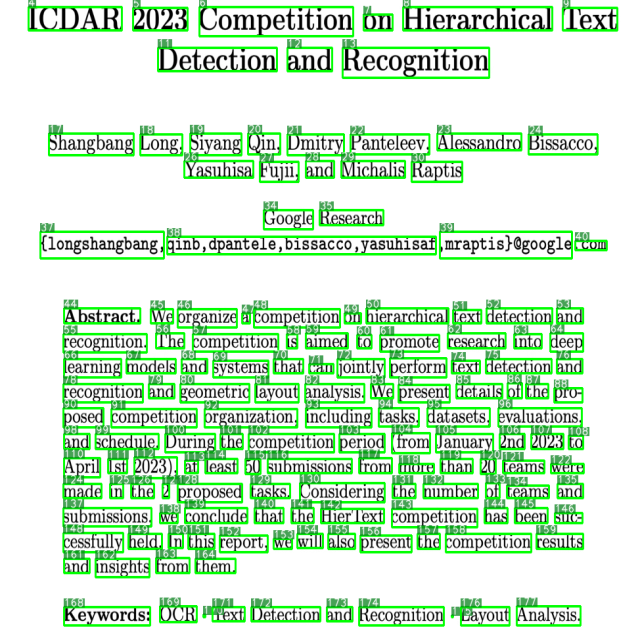
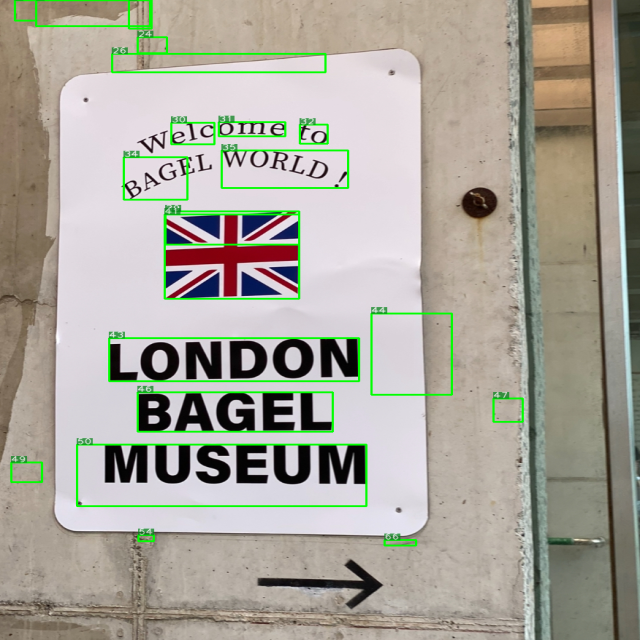
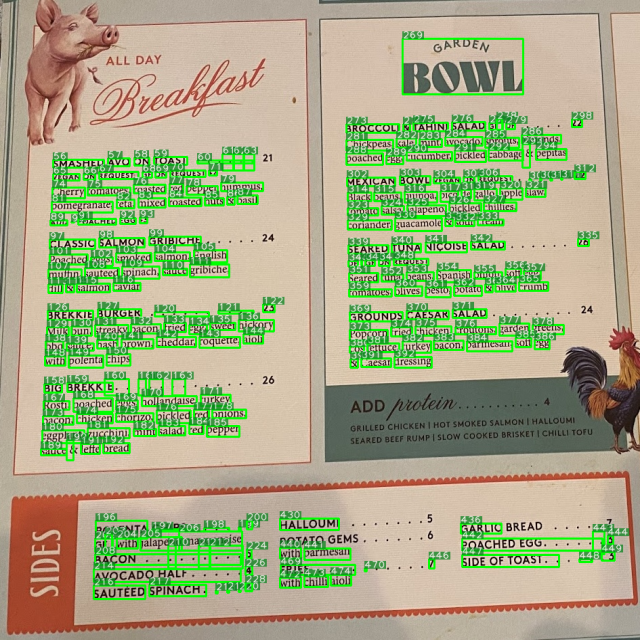
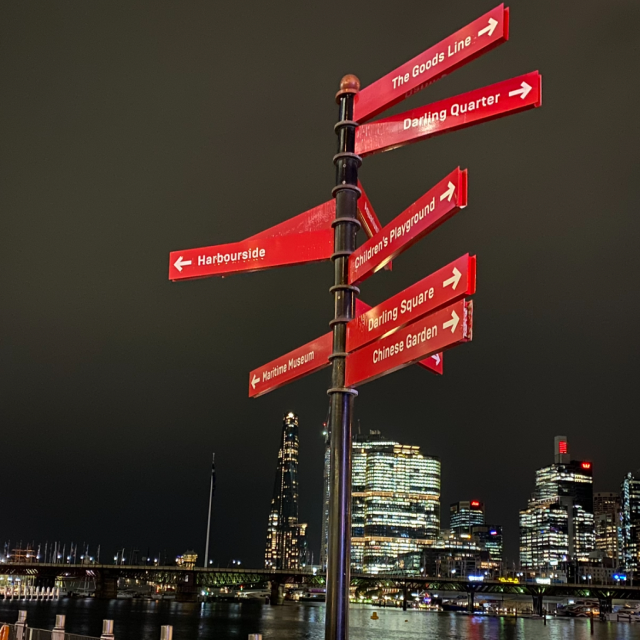
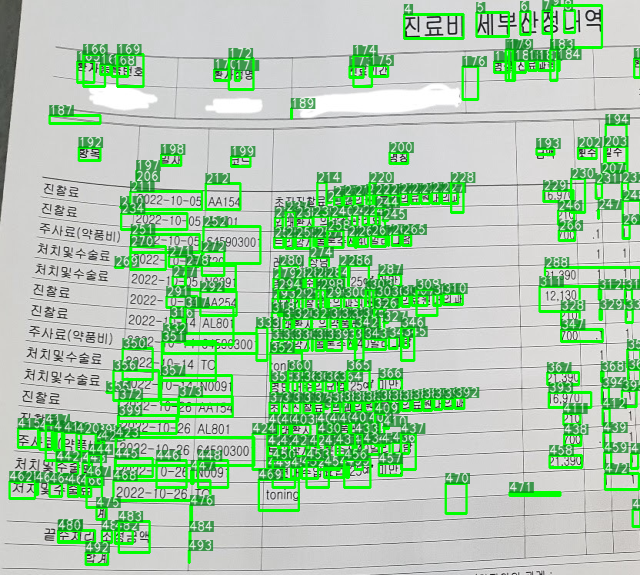
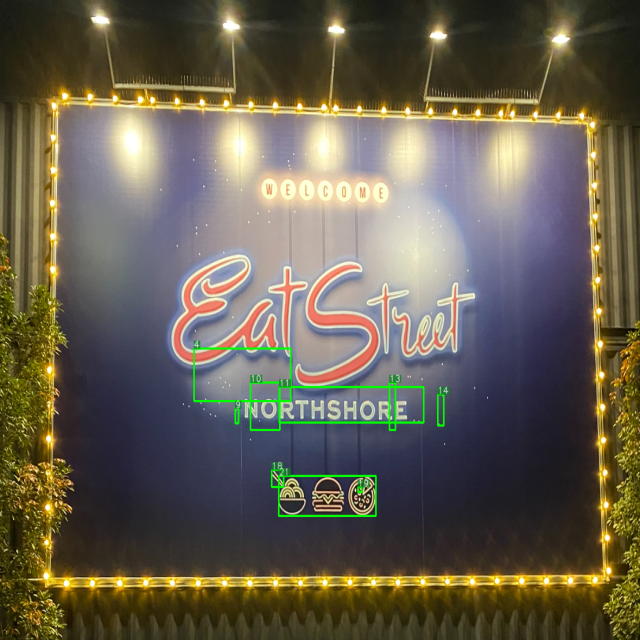
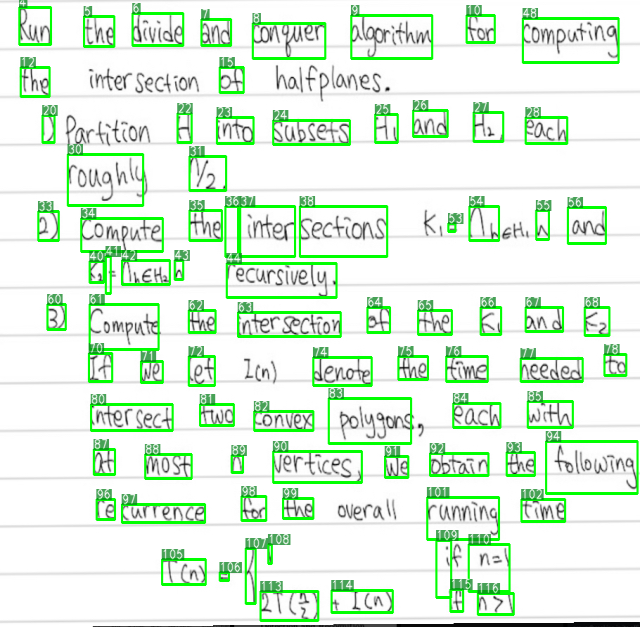
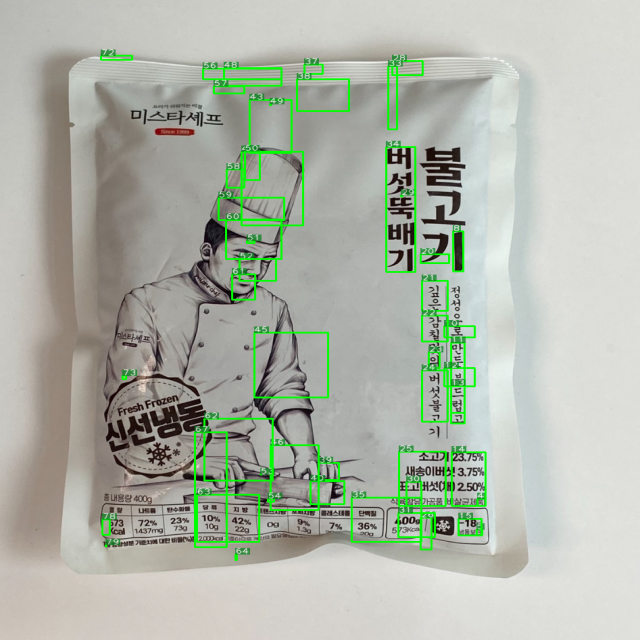

In [ ]:
data = pd.DataFrame()
for idx, fn in enumerate(list(images.keys())):
    image = images[fn].copy()
    height, width = image.shape[0], image.shape[1]
    conf_high_prediction = ''
    conf_low_prediction = ''
    conf_high_print_cnt = 0
    conf_low_print_cnt = 0
    n_boxes = len(results_tesseract[fn]['level'])
    for i in range(n_boxes):
        # 텍스트 영역을 검출한 박스마다 text prediction 결과와 confidence 값을 얻는 과정
        pred, conf = results_tesseract[fn]['text'][i], results_tesseract[fn]['conf'][i]*0.01

        # confidence 값이 0.1 이상인 결과들을 시각화하는 과정
        if ' ' not in pred and len(pred) > 0 and conf > 0.1:
            # 텍스트 영역에 대한 bbox를 이미지에 표기하는 과정
            x, y, w, h = results_tesseract[fn]['left'][i], results_tesseract[fn]['top'][i], results_tesseract[fn]['width'][i], results_tesseract[fn]['height'][i]
            image = cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)

            # bbox index를 이미지에 표기하는 과정
            text_size = cv2.getTextSize(str(i), cv2.FONT_HERSHEY_PLAIN, 1, 1)[0]
            rect_size = (text_size[0], text_size[1])
            overlay = image.copy()
            overlay = cv2.rectangle(overlay, (x, y), (x + rect_size[0], y - rect_size[1]), (10, 130, 30), -1)
            overlay = cv2.putText(overlay, str(i), (x, y), cv2.FONT_HERSHEY_PLAIN, 1, (255,255,255), 1, cv2.LINE_AA)
            image = cv2.addWeighted(overlay, 0.75, image, 0.25, 0, image)

            # bbox index와 prediction 결과를 하나로 저장함
            pred_string = f' [bbox {i}] : &nbsp;&nbsp; {pred} &nbsp;&nbsp; {conf:.2f}<br>'

            # confidence 값이 0.5보다 낮으면 conf_low_prediction에 저장됨
            # confidence 값이 0.5 이상이면 conf_high_prediction에 저장됨
            # visualization 편의를 위해 conf_low_prediction과 conf_high_prediction에는 각각 30개의 결과만 저장함
            if conf > 0 and conf < 0.5 and conf_low_print_cnt < 30:
                conf_low_prediction += pred_string
                conf_low_print_cnt +=1
            elif conf >= 0.5 and conf_high_print_cnt < 30:
                conf_high_prediction += pred_string
                conf_high_print_cnt += 1

    # 편의를 위해 이미지를 적당한 크기로 리사이즈 해줌
    image = cv2.resize(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), dsize=(min(width, 640), min(height, 640)), interpolation=cv2.INTER_AREA)
    # pandas로 이미지 출력하기 위해서 인코딩 해주는 작업
    _, img_png = cv2.imencode('.png', image.astype('uint8'))
    img_bytes = img_png.tobytes()
    img_base64 = base64.b64encode(img_bytes).decode('utf-8')
    img_tag = f'<img src="data:image/png;base64,{img_base64}">'

    data.loc[idx, 'file name'] = fn
    data.loc[idx, 'img'] = img_tag
    data.loc[idx, 'predictions with high conf'] = conf_high_prediction + '<br>'
    data.loc[idx, 'predictions with low conf'] = conf_low_prediction + '<br>'

# Display the DataFrame with HTML
data = data.style.set_properties(**{'text-align': 'left'})
display(HTML(data.to_html(escape=False)))

In [ ]:
# 한국어와 영어를 식별할 수 있는 모델을 로드함
reader = easyocr.Reader(['ko','en'])

# 각 이미지에 대한 추론 결과들을 results에 저장
results_easyocr = {}
for fn in list(images.keys()):
    result = reader.readtext(images[fn])
    results_easyocr[fn] = result
    print(f'* {fn}\n\t{result}')

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete* 01_ocr_docs.PNG
	[([[36, 0], [542, 0], [542, 52], [36, 52]], 'ICDAR 2023 Competition', 0.7149547892914148), ([[549, 1], [945, 1], [945, 45], [549, 45]], 'on Hierarchical Text', 0.8174714339735213), ([[234, 50], [750, 50], [750, 100], [234, 100]], 'Detection and Recognition', 0.8507057298546781), ([[69, 152], [915, 152], [915, 196], [69, 196]], 'Shangbang Long; Siyang Qin; Dmitry Panteleev, Alessandro Bissacco,', 0.6610593187519604), ([[278, 190], [708, 190], [708, 222], [278, 222]], 'Yasuhisa Fujii, and Michalis Raptis', 0.831484407503078), ([[398, 248], [586, 248], [586, 278], [398, 278]], 'Google Research', 0.9997914514039948), ([[54, 274], [927, 274], [927, 313], [54, 313]], '{1ongshangbang, qinb, dpantele,bissacco ,yasuhisaf ,mraptis}@google. com', 0.6468404861439365), ([[96, 366], [218, 366], [218, 392], [96, 392]], 'Abstract.', 0.9921542492092116), ([[227, 362], [891, 362], [891, 399], [227, 399]], 'W

,file name,img,predictions with high conf,predictions with low conf
0,01_ocr_docs.PNG,,"[bbox 0] : ICDAR 2023 Competition 0.7150 [bbox 1] : on Hierarchical Text 0.8175 [bbox 2] : Detection and Recognition 0.8507 [bbox 3] : Shangbang Long; Siyang Qin; Dmitry Panteleev, Alessandro Bissacco, 0.6611 [bbox 4] : Yasuhisa Fujii, and Michalis Raptis 0.8315 [bbox 5] : Google Research 0.9998 [bbox 6] : {1ongshangbang, qinb, dpantele,bissacco ,yasuhisaf ,mraptis}@google. com 0.6468 [bbox 7] : Abstract. 0.9922 [bbox 8] : We organize a competition on hierarchical text detection and 0.9019 [bbox 9] : recognition. 0.9368 [bbox 10] : The competition is aimed 0.5858 [bbox 11] : to promote research into 0.7226 [bbox 12] : learning models and systems that can jointly perform text detection and 0.6645 [bbox 13] : recognition and geometric layout analysis 0.8470 [bbox 14] : We present details of the pro 0.8095 [bbox 15] : posed competition organization, including tasks, datasets evaluations, 0.7956 [bbox 16] : and schedule. During the competition period (from January 2nd 2023 to 0.7577 [bbox 17] : April 1st 2023), at least 50 submissions from 0.6576 [bbox 18] : more than 20 teams 0.6582 [bbox 19] : were 0.7933 [bbox 20] : made in 0.9643 [bbox 21] : the 0.9999 [bbox 22] : proposed tasks. Considering 0.7396 [bbox 23] : the number of teams and 0.5270 [bbox 24] : submissions, 0.9996 [bbox 25] : we conclude that the HierText 0.7714 [bbox 26] : competition has been 0.6444 [bbox 27] : suc- 0.9757 [bbox 28] : cessfully held. In this report, we will also present the competition results 0.9383 [bbox 29] : and insights from them. 0.8582",
1,02_ocr_poster.PNG,,[bbox 0] : to 1.0000 [bbox 1] : LONDON 0.9999 [bbox 2] : BAGEL 1.0000 [bbox 3] : MUSEUM 0.9989 [bbox 4] : Welcome 0.9998 [bbox 5] : WORLD ! 0.9976 [bbox 6] : BAGEL 0.9996,
2,03_ocr_menu.jpg,,"[bbox 0] : GARDEN 0.6898 [bbox 1] : ALL 0.9999 [bbox 2] : DAY 0.9919 [bbox 3] : BOIL 0.7950 [bbox 4] : BROCCOLI & TAHINI SALAD GF | DF 0.5717 [bbox 6] : SMASHED 0.7156 [bbox 7] : ON TOAST 0.9074 [bbox 8] : poached egg; cucumber; 0.7283 [bbox 9] : cabbage & 0.9623 [bbox 10] : VEGAN ON REQUEST 0.7411 [bbox 11] : GF ON REGUEST +2 0.7134 [bbox 12] : REQUEST 0.8201 [bbox 13] : MEXICAN BOWL VEGAN ON 0.8189 [bbox 14] : Cherry tomatoes 0.9998 [bbox 15] : red pepper hummus 0.7143 [bbox 16] : apple slaw; 0.6694 [bbox 17] : feta, mixed roasted nuts & basil 0.6682 [bbox 18] : Black beans, quinoa 0.5711 [bbox 19] : pomegranate, 0.6789 [bbox 20] : tomato salsa, jalapeno; pickled chillies; 0.7134 [bbox 21] : ADD 0.9956 [bbox 22] : POACHED EGG +3 0.6026 [bbox 23] : coriander; 0.8872 [bbox 24] : Buacamole & sour cream 0.8180 [bbox 25] : CLASSIC SALMON GRIBICHE 0.9342 [bbox 26] : NICOISE SALAD 0.9733 [bbox 27] : SEARED TUNA 0.9738 [bbox 28] : Poached eggs; smoked salmon; English 0.6263 [bbox 29] : DF | GF ON REGUEST 0.6762 [bbox 30] : muffin; sauteed spinach; sauce gribiche; 0.5910","[bbox 5] : Chickpeas; kale; mint; avocado; sprouts; almonds, 0.4272 [bbox 31] : Seared tuna, bears; Spanish onion; soft egg; 0.4036 [bbox 41] : bbq sauce, hash brown; cheddar; roquette; aioli 0.3857 [bbox 43] : COs 0.2987 [bbox 53] : bacon; chicken chorizo, 0.3982 [bbox 71] : 뜻 0.0749 [bbox 78] : @fi@__ast 0.0281"
3,04_ocr_rotated.PNG,,"[bbox 0] : The 0.9784 [bbox 1] : Line 0.8283 [bbox 2] : Goods 0.9993 [bbox 3] : Quarter 1.0000 [bbox 4] : Danling 0.5939 [bbox 5] : ""Playground 0.7377 [bbox 7] : Harbourside 1.0000 [bbox 8] : 'Square 0.5766 [bbox 9] : ""Darling 0.9215 [bbox 11] : Chinese [ 0.9589","[bbox 6] : 'Childrens 0.3036 [bbox 10] : 'Garden ` 0.2694 [bbox 12] : ""Huseum 0.1660 [bbox 13] : 'Namitine| 0.1583"
4,05_ocr_table.jpg,,"[bbox 0] : 진료비 세부산정내역 0.8454 [bbox 3] : 진료기간 0.9984 [bbox 4] : 병실(진료과목) 0.7669 [bbox 5] : 당록 0.6528 [bbox 6] : 일자 0.9980 [bbox 7] : 코드 1.0000 [bbox 9] : 금액 0.9999 [bbox 10] : 횟수 0.8845 [bbox 11] : 일수 0.6893 [bbox 13] : 2022-10 0.9999 [bbox 14] : AA154 0.7588 [bbox 16] : 16,970 0.9976 [bbox 18] : 210 0.9982 [bbox 19] : 2022 
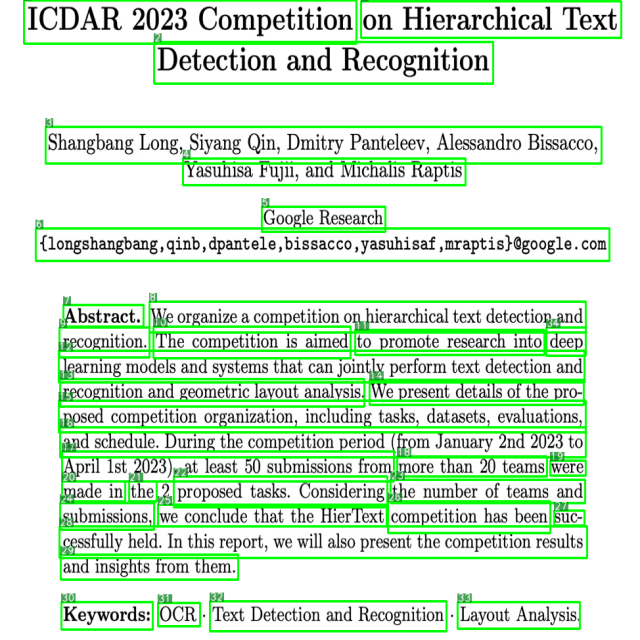
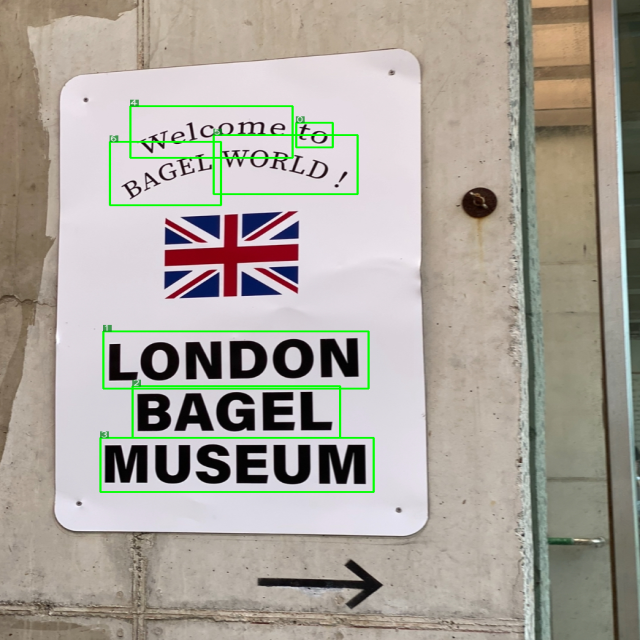
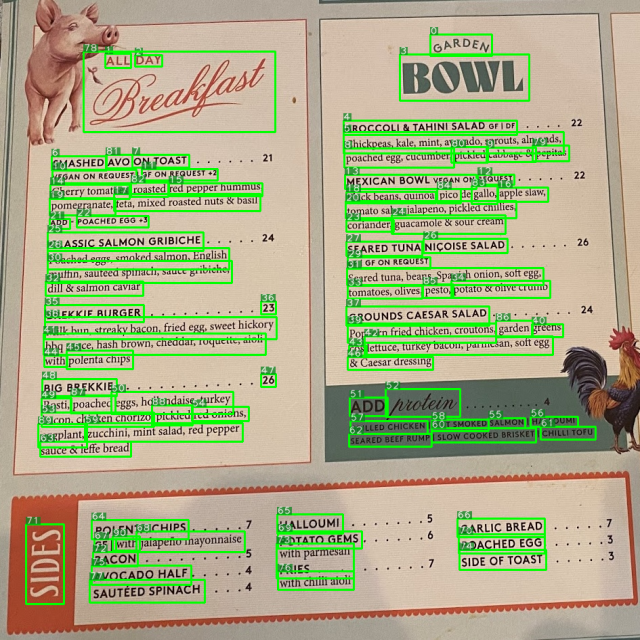
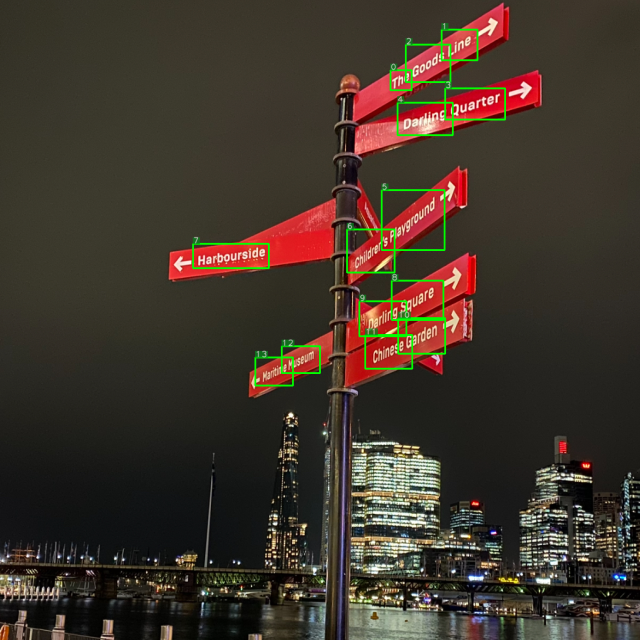
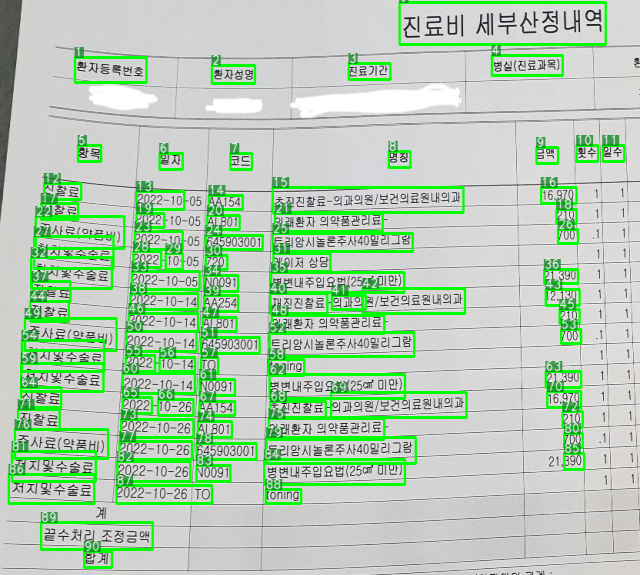
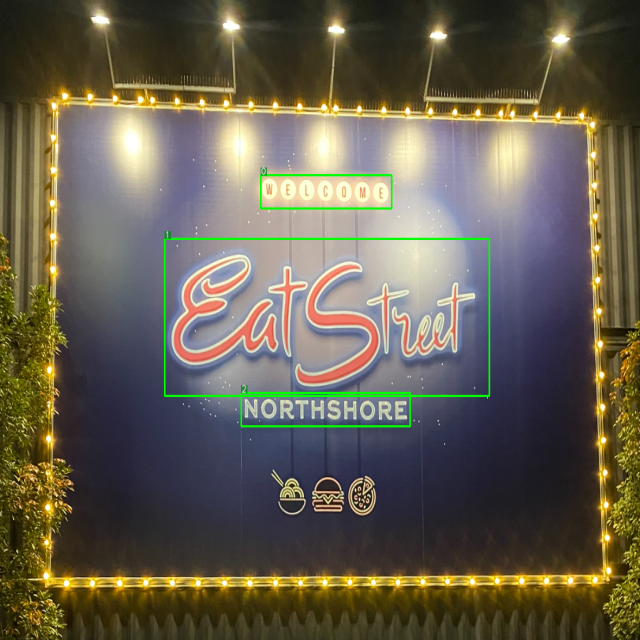
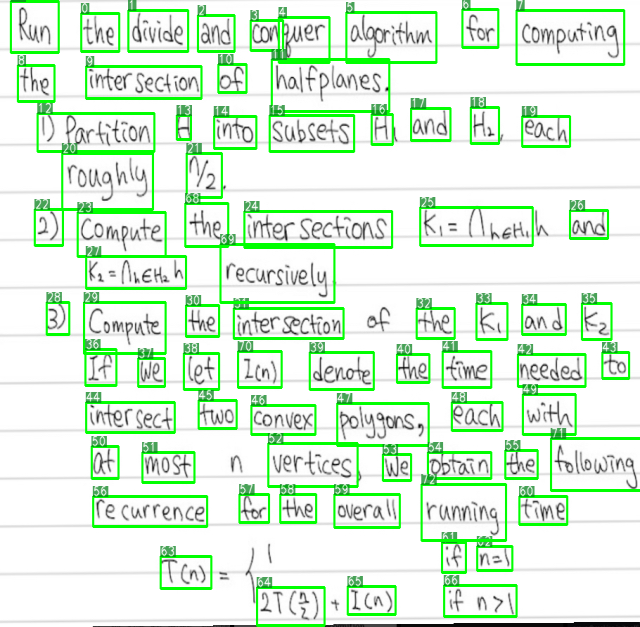
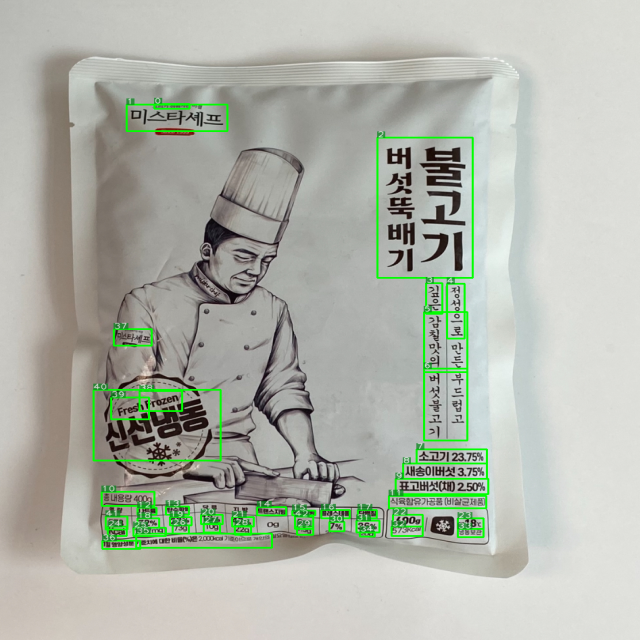

In [ ]:
def bounding_box_to_coords(bounding_box):
    """
    bounding box의 x 좌표들과 y 좌표들이 순서 없이 주어지므로,
    이를 x_min, y_min, x_max, y_max로 변환한 뒤 반환해 주는 함수
    """
    x_coords, y_coords = zip(*bounding_box)
    x_min = int(min(x_coords))
    y_min = int(min(y_coords))
    x_max = int(max(x_coords))
    y_max = int(max(y_coords))
    return x_min, y_min, x_max, y_max

data = pd.DataFrame()
for idx, fn in enumerate(list(images.keys())):
    image = images[fn].copy()
    height, width = image.shape[0], image.shape[1]
    conf_high_prediction = ''
    conf_low_prediction = ''
    conf_high_print_cnt = 0
    conf_low_print_cnt = 0
    for i, bbox in enumerate(results_easyocr[fn]):
        # 텍스트 영역에 대한 bbox를 이미지에 표기하는 과정
        box, pred, conf = bbox
        x_min, y_min, x_max, y_max = bounding_box_to_coords(box)
        image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

        # bbox index를 이미지에 표기하는 과정
        text_size = cv2.getTextSize(str(i), cv2.FONT_HERSHEY_PLAIN, 1, 1)[0]
        rect_size = (text_size[0], text_size[1])
        overlay = image.copy()
        overlay = cv2.rectangle(overlay, (x_min, y_min), (x_min + rect_size[0], y_min - rect_size[1]), (10, 130, 30), -1)
        overlay = cv2.putText(overlay, str(i), (x_min, y_min), cv2.FONT_HERSHEY_PLAIN, 1, (255,255,255), 1, cv2.LINE_AA)
        image = cv2.addWeighted(overlay, 0.75, image, 0.25, 0, image)

        # bbox index와 prediction 결과를 하나로 저장함
        pred_string = f' [bbox {i}] : &nbsp;&nbsp; {pred} &nbsp;&nbsp; {conf:.4f}<br>'

        # confidence 값이 0.5보다 낮으면 conf_low_prediction에 저장됨
        # confidence 값이 0.5 이상이면 conf_high_prediction에 저장됨
        # 가독성을 위해서 low conf와 high conf를 가진 prediction 결과를 각각 30개까지만 출력함
        if conf < 0.5 and conf_low_print_cnt < 30:
            conf_low_prediction += pred_string
            conf_low_print_cnt = 1
        elif conf >= 0.5 and conf_high_print_cnt < 30:
            conf_high_prediction += pred_string
            conf_high_print_cnt += 1

    # 편의를 위해 이미지를 적당한 크기로 리사이즈 해줌
    image = cv2.resize(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), dsize=(min(width, 640), min(height, 640)), interpolation=cv2.INTER_AREA)
    # pandas로 이미지 출력하기 위해서 인코딩 해주는 작업
    _, img_png = cv2.imencode('.png', image.astype('uint8'))
    img_bytes = img_png.tobytes()
    img_base64 = base64.b64encode(img_bytes).decode('utf-8')
    img_tag = f'<img src="data:image/png;base64,{img_base64}">'

    data.loc[idx, 'file name'] = fn
    data.loc[idx, 'img'] = img_tag
    data.loc[idx, 'predictions with high conf'] = conf_high_prediction + '<br>'
    data.loc[idx, 'predictions with low conf'] = conf_low_prediction + '<br>'

# Display the DataFrame with HTML
data = data.style.set_properties(**{'text-align': 'left'})
display(HTML(data.to_html(escape=False)))

In [ ]:
# 텍스트 부분만 crop된 테스트 이미지들을 /content/ocr_examples_cropped 경로에 mount 하는 과정
!gdown https://drive.google.com/drive/folders/1eZrEtt1UUMkCXUjEw8CrLRcha0RM1wQw?usp=sharing -O /content/ --folder

Retrieving folder list
Processing file 1s99PL-hCTP1NBDw9wjkX-0Lz5oPY_5Eo 01_ocr_cropped_plain.PNG
Processing file 1783_kAzcCVaBrP6aYPG4N1NEI9Mkwzkr 02_ocr_cropped_curved.PNG
Processing file 11uiqzKMgTtzqjwhszBYqJ0ly2mBsezJp 03_ocr_cropped_rotated.PNG
Processing file 1eYuUlCuLZz2z_sN_BwnlX3kQNaORjdgw 04_ocr_cropped_vertical.PNG
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1s99PL-hCTP1NBDw9wjkX-0Lz5oPY_5Eo
To: /content/ocr_examples_cropped/01_ocr_cropped_plain.PNG
100% 144k/144k [00:00<00:00, 77.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1783_kAzcCVaBrP6aYPG4N1NEI9Mkwzkr
To: /content/ocr_examples_cropped/02_ocr_cropped_curved.PNG
100% 327k/327k [00:00<00:00, 115MB/s]
Downloading...
From: https://drive.google.com/uc?id=11uiqzKMgTtzqjwhszBYqJ0ly2mBsezJp
To: /content/ocr_examples_cropped/03_ocr_cropped_rotated.PNG
100% 206k/206k [00:00<00:00, 125MB/s]
Downloading...
Fr

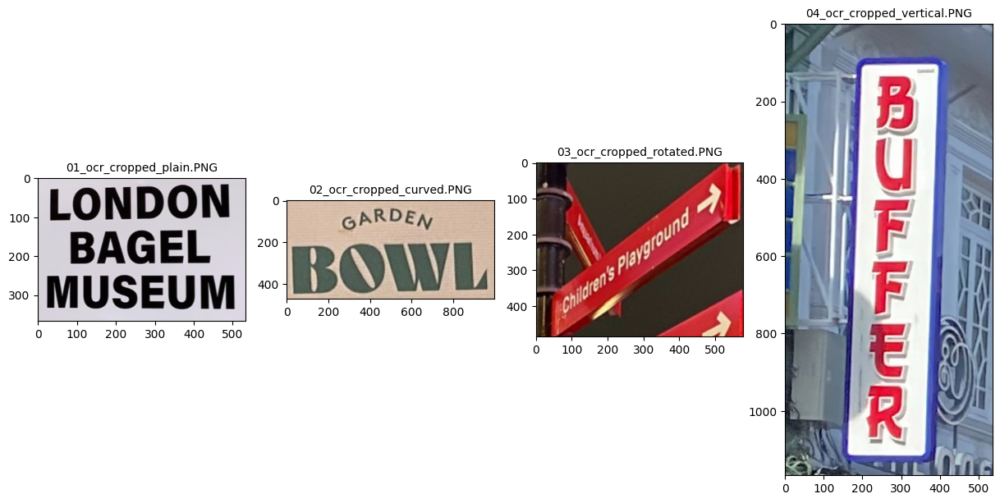

In [ ]:
# Visualization of Test Images
image_list = sorted([fn for fn in os.listdir('/content/ocr_examples_cropped/') if fn.endswith('.jpg') or fn.endswith('.PNG')])
images_cropped = {}
fig = plt.figure(figsize=(15, 20))

for i, fn in enumerate(image_list):
    images_cropped[fn] = cv2.cvtColor(cv2.imread('/content/ocr_examples_cropped/'+fn), cv2.COLOR_BGR2RGB)
    a = fig.add_subplot(1, 4, i+1)
    plt.imshow(images_cropped[fn])
    a.set_title(fn, fontsize=10)

In [ ]:
results_tesseract_cropped = {}
results_easyocr_cropped = {}
for fn in list(images_cropped.keys()):
    result_easyocr = reader.readtext(images_cropped[fn])
    results_easyocr_cropped[fn] = result_easyocr
    print(f'* {fn}\n\t EasyOCR:{result_easyocr}')

    psm = '5' if 'vertical' in fn else '6'
    result_tesseract = pytesseract.image_to_data(images_cropped[fn], output_type=Output.DICT, lang='eng', config=f'--psm {psm}')
    results_tesseract_cropped[fn] = result_tesseract
    print(f'\ttesseract:{result_tesseract["text"]}')

* 01_ocr_cropped_plain.PNG
	 EasyOCR:[([[22, 5], [503, 5], [503, 121], [22, 121]], 'LONDON', 0.9996412615172016), ([[75, 123], [453, 123], [453, 231], [75, 231]], 'BAGEL', 0.9998721035106147), ([[18, 233], [515, 233], [515, 349], [18, 349]], 'MUSEUM', 0.9967990905275214)]
	tesseract:['', '', '', '', 'LONDON', '', 'BAGEL', '', 'MUSEUM']
* 02_ocr_cropped_curved.PNG
	 EasyOCR:[([[252, 22], [715, 22], [715, 155], [252, 155]], 'GARDEN', 0.9850815293697097), ([[36, 183], [998, 183], [998, 467], [36, 467]], 'BOVL', 0.451876699924469)]
	tesseract:['', '', '', '', 'BOWL']
* 03_ocr_cropped_rotated.PNG
	 EasyOCR:[([[193.15469664863897, 266.03978447557324], [423.8361981003981, 107.1488109256196], [457.845303351361, 177.96021552442673], [228.16380189960188, 336.8511890743804]], "'Playground", 0.8167035558905683), ([[47.02372034707875, 379.06841446425915], [214.43450765758166, 265.5838074411216], [241.97627965292125, 321.93158553574085], [74.56549234241832, 436.4161925588784]], 'Childrens', 0.672493

,file name,img,EasyOCR Predictions,Tesseract Predictions
0,01_ocr_cropped_plain.PNG,,[bbox 0] : LONDON 0.9996 [bbox 1] : BAGEL 0.9999 [bbox 2] : MUSEUM 0.9968,[bbox 4] : LONDON 0.96 [bbox 6] : BAGEL 0.96 [bbox 8] : MUSEUM 0.96
1,02_ocr_cropped_curved.PNG,,[bbox 0] : GARDEN 0.9851 [bbox 1] : BOVL 0.4519,[bbox 4] : BOWL 0.94
2,03_ocr_cropped_rotated.PNG,,[bbox 0] : 'Playground 0.8167 [bbox 1] : Childrens 0.6725,[bbox 5] : | 0.86 [bbox 7] : | 0.32 [bbox 11] : yo 0.28 [bbox 13] : 7s 0.15 [bbox 14] : yr 0.52 [bbox 16] : | 0.46 [bbox 17] : —_ 0.46
3,04_ocr_cropped_vertical.PNG,,[bbox 0] : @ 0.0310,[bbox 5] : ee 0.24 [bbox 6] : - 0.63 [bbox 8] : — 0.78 [bbox 9] : . 0.32 [bbox 12] : = 0.39 [bbox 14] : ee 0.33 [bbox 15] : = 0.78 [bbox 21] : wre 0.56 [bbox 25] : i 0.19 [bbox 31] : a 0.42

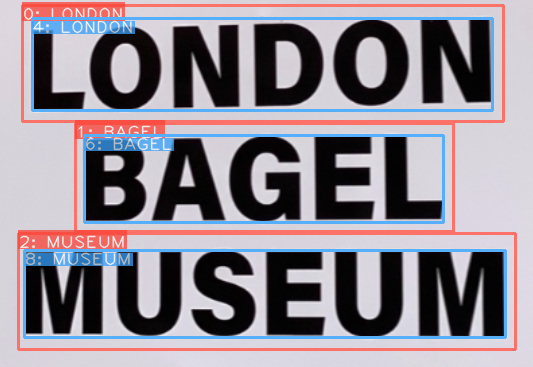
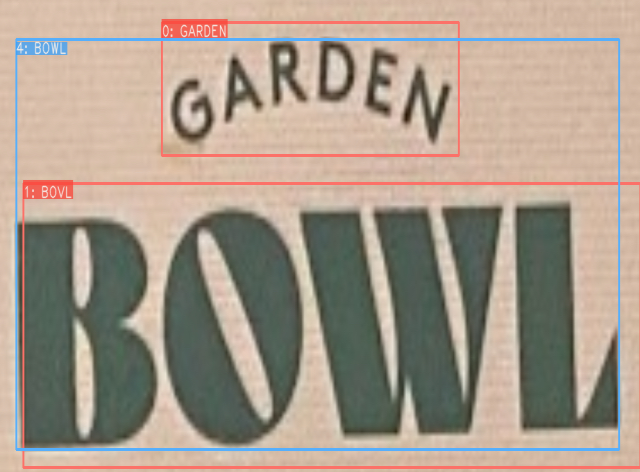
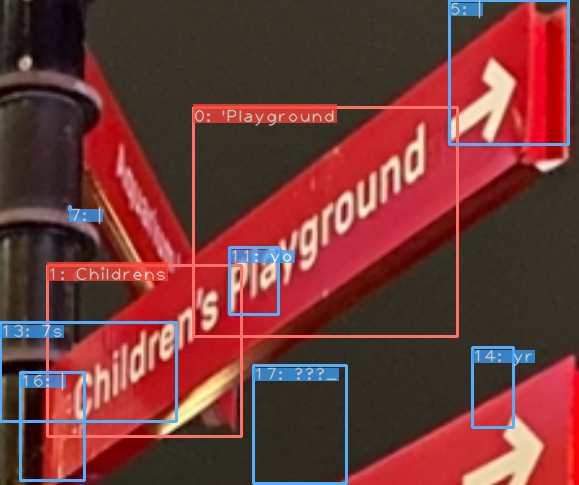
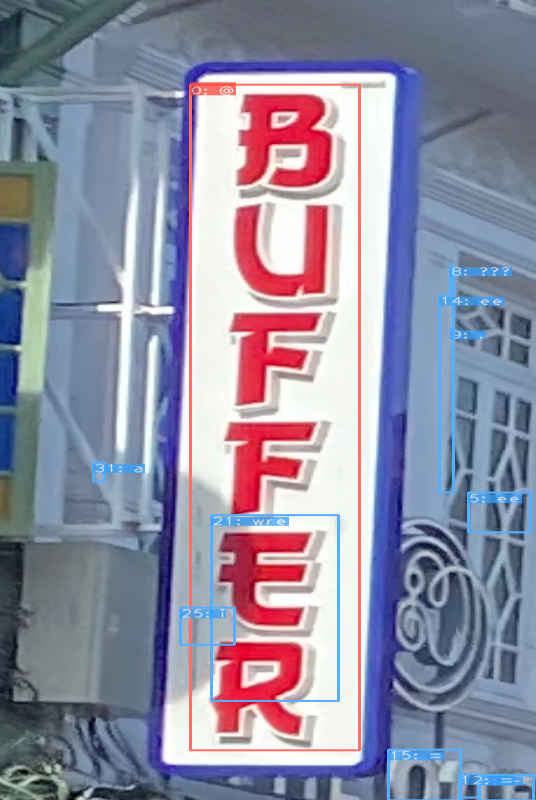

In [ ]:
data = pd.DataFrame()
for idx, fn in enumerate(list(images_cropped.keys())):
    image = images_cropped[fn].copy()
    height, width = image.shape[0], image.shape[1]
    easyocr_prediction = ''
    tesseract_prediction = ''

    for i_e, bbox in enumerate(results_easyocr_cropped[fn]):
        box, pred, conf = bbox
        x_min, y_min, x_max, y_max = bounding_box_to_coords(box)

        # EasyOCR이 인식한 텍스트 영역의 bbox는 빨간색으로 표시함
        image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (252, 113, 104), 2)
        text_size = cv2.getTextSize(str(i_e)+': '+str(pred), cv2.FONT_HERSHEY_PLAIN, 1.2, 1)[0]
        rect_size = (text_size[0], text_size[1])

        # 박스에 추론한 text를 bbox index와 함께 표기해줌
        overlay = image.copy()
        overlay = cv2.rectangle(overlay, (x_min, y_min+15), (x_min + rect_size[0], y_min - 15 + rect_size[1]), (250, 67, 55), -1)
        overlay = cv2.putText(overlay, str(i_e)+': '+str(pred), (x_min, y_min+15), cv2.FONT_HERSHEY_PLAIN, 1.2, (255,255,255), 1, cv2.LINE_AA)
        image = cv2.addWeighted(overlay, 0.75, image, 0.25, 0, image)
        pred_string = f' [bbox {i_e}] : &nbsp;&nbsp; {pred} &nbsp;&nbsp; {conf:.4f}<br>'
        easyocr_prediction += pred_string

    n_boxes = len(results_tesseract_cropped[fn]['level'])
    for i_t in range(n_boxes):
        pred, conf = results_tesseract_cropped[fn]['text'][i_t], results_tesseract_cropped[fn]['conf'][i_t]*0.01
        if conf > 0.1:
            x, y, w, h = results_tesseract_cropped[fn]['left'][i_t], results_tesseract_cropped[fn]['top'][i_t], results_tesseract_cropped[fn]['width'][i_t], results_tesseract_cropped[fn]['height'][i_t]
            # Tesseract가 인식한 텍스트 영역의 bbox는 파란색으로 표시함
            image = cv2.rectangle(image, (x, y), (x+w, y+h), (86, 175, 252), 2)
            text_size = cv2.getTextSize(str(i_t)+': '+str(pred), cv2.FONT_HERSHEY_PLAIN, 1.2, 1)[0]
            rect_size = (text_size[0], text_size[1])

            # 박스에 추론한 text를 bbox index와 함께 표기해줌
            overlay = image.copy()
            overlay = cv2.rectangle(overlay, (x, y+15), (x + rect_size[0], y + 15 - rect_size[1]), (55, 159, 250), -1)
            overlay = cv2.putText(overlay, str(i_t)+': '+str(pred), (x, y+15), cv2.FONT_HERSHEY_PLAIN, 1.2, (255,255,255), 1, cv2.LINE_AA)
            image = cv2.addWeighted(overlay, 0.75, image, 0.25, 0, image)
            pred_string = f' [bbox {i_t}] : &nbsp;&nbsp; {pred} &nbsp;&nbsp; {conf:.2f}<br>'
            tesseract_prediction += pred_string

    image = cv2.resize(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), dsize=(min(width, 640), min(height, 800)), interpolation=cv2.INTER_AREA)
    _, img_png = cv2.imencode('.png', image.astype('uint8'))
    img_bytes = img_png.tobytes()
    img_base64 = base64.b64encode(img_bytes).decode('utf-8')
    img_tag = f'<img src="data:image/png;base64,{img_base64}">'

    data.loc[idx, 'file name'] = fn
    data.loc[idx, 'img'] = img_tag
    data.loc[idx, 'EasyOCR Predictions'] = easyocr_prediction + '<br>'
    data.loc[idx, 'Tesseract Predictions'] = tesseract_prediction + '<br>'

# Display the DataFrame with HTML
data = data.style.set_properties(**{'text-align': 'left'})
display(HTML(data.to_html(escape=False)))